# Information About Data Set

1)  -  ID Number 

2)  -  Diagnosis (M = malignant (الورم خبيث) , B = benign (الورم حميد) )

#### ==> Ten real-valued features are computed for each cell nucleus:

3)  - radius (mean of distances from center to points on the perimeter)

4)  - texture (standard deviation of gray-scale values)

5)  - perimeter

6)  - area

7)  - smoothness (local variation in radius lengths)

8)  - compactness (perimeter^2 / area - 1.0)

9)  - concavity (severity of concave portions of the contour)

10) - concave points (number of concave portions of the contour)

11) - symmetry

12) - fractal dimension ("coastline approximation" - 1)

""" The mean, standard error and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features. For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius. """


# ==============================================

# 1) - Library 

In [1]:
# Remove Warning
import warnings
warnings.filterwarnings('ignore')
# ==============================================
# ==============================================
# Data Analysis Libraries
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
# ==============================================
# ==============================================
## Preprocessing & ML Algorithm
# ==> Split Data
from sklearn.model_selection import train_test_split
# ===> Data Scaling
from sklearn.preprocessing import StandardScaler
# ==> ML Algorithm
from sklearn.svm import SVC 
# ==> Matix Score
from sklearn.metrics import confusion_matrix , f1_score , classification_report ,accuracy_score
# ==============================================
# ==============================================
# ==> Load And Save Model & Scaler
import pickle
import joblib

# ==============================================

# 2) - Data Preparation {EDA}

## Data Exploration

In [2]:
data = pd.read_csv(r'data.csv')
df = data.copy()
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
df.tail()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,NaN


In [4]:
df.shape

(569, 33)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

- The Data Loss in Column { Unnamed: 32 }  

In [6]:
# Statistics for Numbers Data Only
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [7]:
# Statistics for Numbers Data Only
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


# ==============================================

## Check Is NULL

In [8]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

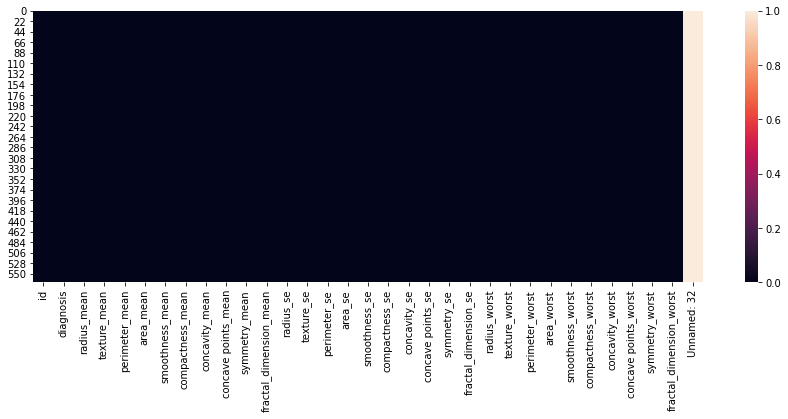

In [9]:
plt.figure(figsize = (15,5))
sns.heatmap(df.isnull());

# ==============================================

## Check IS Duplicated

In [10]:
df.duplicated().sum()

0

# ==============================================

## *⚑Data Analysis* 

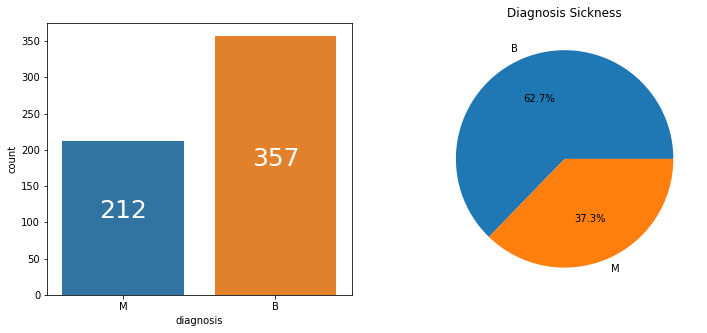

In [11]:
# Value Count For Output Data 
# ==============================================
# Show And Arrange Figure OF Data
fig , axs = plt.subplots(1,2,figsize = (12,5))
# ==============================================
# ==> Column 1 
ax_draw_value = sns.countplot(x = 'diagnosis',data = df , ax = axs[0])
for p in ax_draw_value.patches:
    ax_draw_value.text(p.get_x() + p.get_width()/2 , p.get_height()/2 , str(p.get_height()),
                       ha = 'center' , color = 'white' , size = 25)    
# ==============================================
# ==> Column 2
df['diagnosis'].value_counts().plot(kind = 'pie' ,  autopct = '%1.1f%%')
axs[1].set_title('Diagnosis Sickness')
axs[1].set_ylabel('');

In [12]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [13]:
# Drop Unnecessary Columns
df.drop('id',axis= 1 ,inplace=True)
df.drop('Unnamed: 32',axis= 1 ,inplace=True) # inplace [بيتاكد ان البيانات تم حذقها كامله من العمود]
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [14]:
# Encode Output Column 
df['diagnosis'].replace({"M":"1" , "B":"0"} , inplace=True)
df.head(1)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,0.2419,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189


# ==============================================

## Correlation

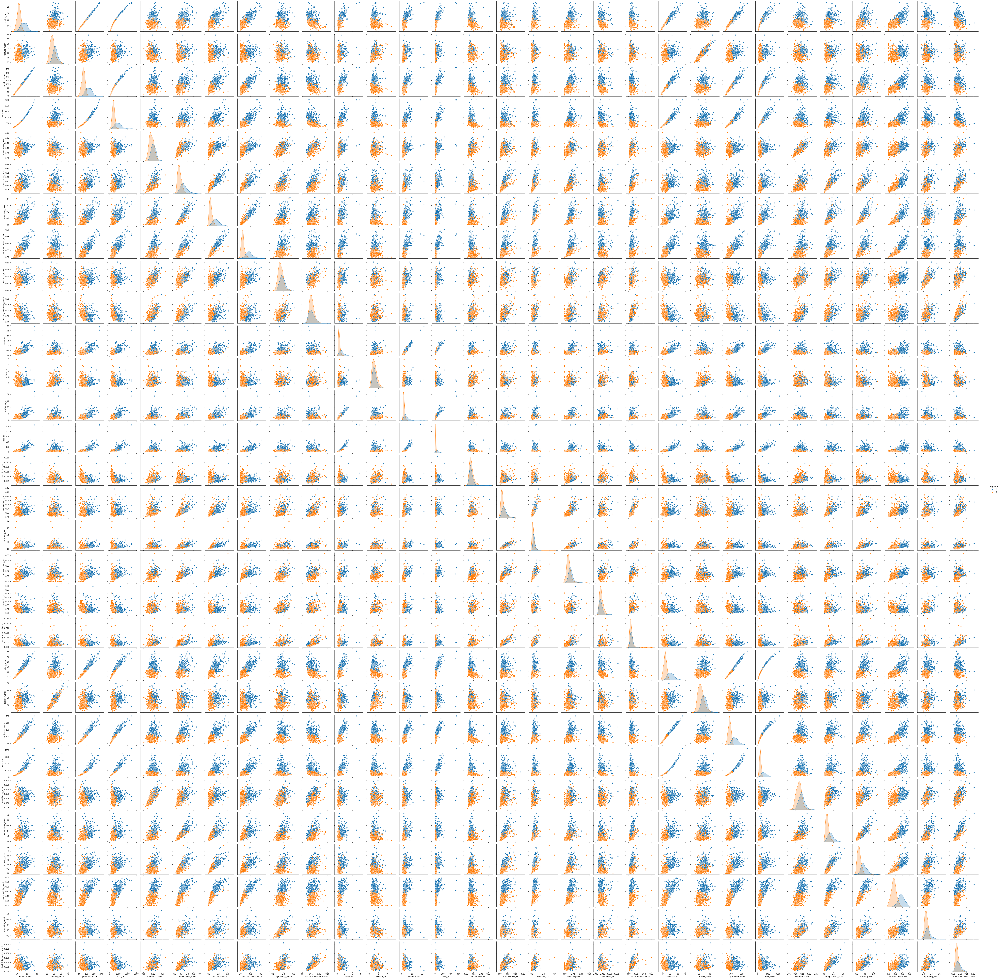

In [15]:
sns.pairplot(df, hue = 'diagnosis')

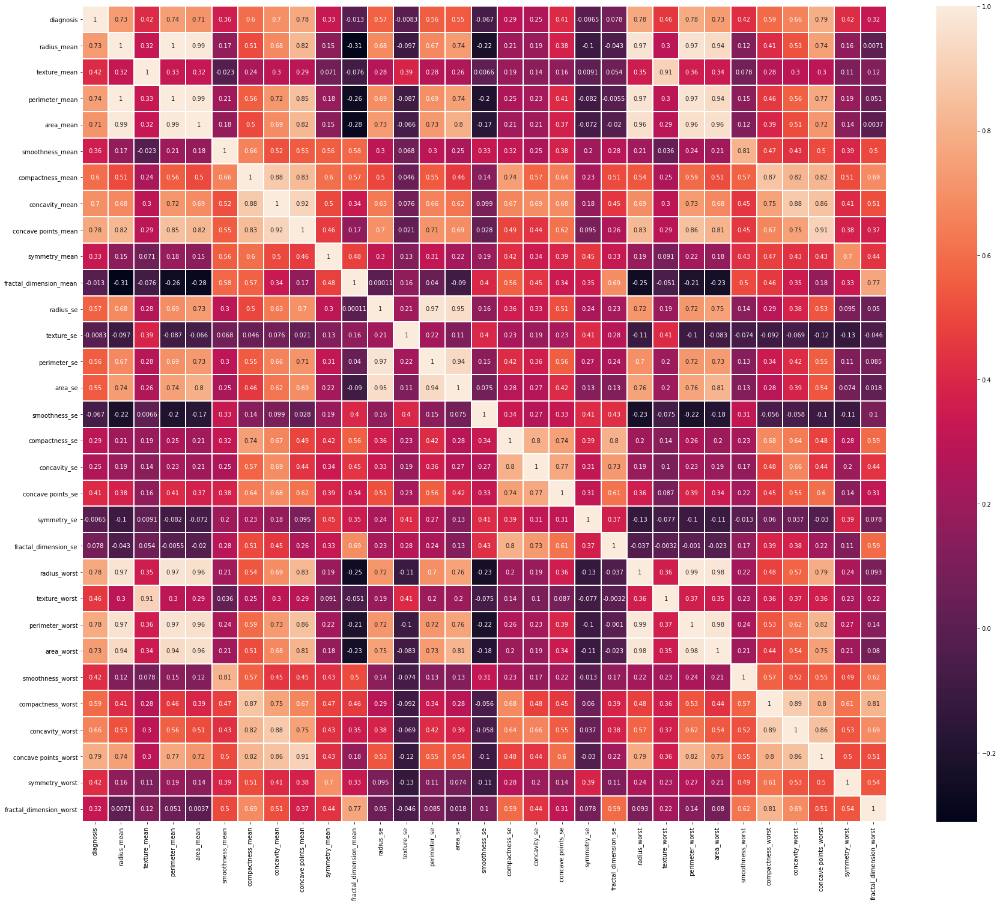

In [16]:
# Realation Between Columns {Value}
cor = df.corr()
plt.figure(figsize=(30,25)) 
sns.heatmap(cor , annot=True,linewidths=1.5);

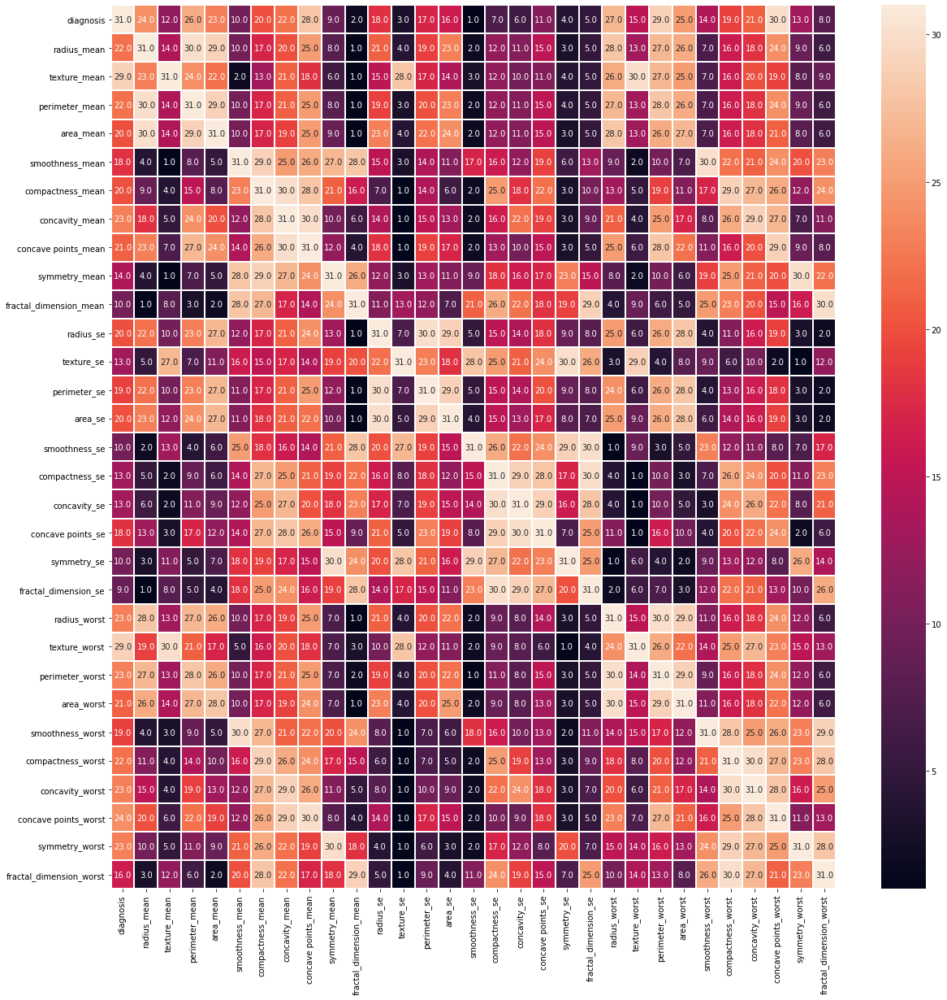

In [17]:
# Realation Between Columns {Value}
plt.figure(figsize=(20,20))
sns.heatmap(cor.rank(axis = 'columns'),annot=True,fmt='.1f',linewidths=1.5);

In [18]:
print(cor['diagnosis'].sort_values(ascending =False))
print('\n===============================================\n')
print(cor['diagnosis'].rank().sort_values(ascending =False))

diagnosis                  1.000000
concave points_worst       0.793566
perimeter_worst            0.782914
concave points_mean        0.776614
radius_worst               0.776454
perimeter_mean             0.742636
area_worst                 0.733825
radius_mean                0.730029
area_mean                  0.708984
concavity_mean             0.696360
concavity_worst            0.659610
compactness_mean           0.596534
compactness_worst          0.590998
radius_se                  0.567134
perimeter_se               0.556141
area_se                    0.548236
texture_worst              0.456903
smoothness_worst           0.421465
symmetry_worst             0.416294
texture_mean               0.415185
concave points_se          0.408042
smoothness_mean            0.358560
symmetry_mean              0.330499
fractal_dimension_worst    0.323872
compactness_se             0.292999
concavity_se               0.253730
fractal_dimension_se       0.077972
symmetry_se               -0

# ==============================================

## *Data Preprocessing*

In [19]:
x = df.drop(['diagnosis'] , axis = 1)
y = df['diagnosis']
# =================================
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# *==============================================*

### Data Splitting

- Data Size  =  569
- Train Data ==> 70 % (398) 
- (CV)  Data ==> 15 % (85)
- Test  Data ==> 15 % (85)

In [20]:
# Split Data to { Train & [Test & Cross Validation(CV)] }
x_train , x_test_cv_Split , y_train , y_test_cv_Split = train_test_split(x , y , test_size=0.3,
                                                                         random_state=42,shuffle=True)
# =============================
print('================================================')
print('Data Size = ',x.shape)
print('================================================')
print('Train Data')
print(x_train.shape)
print(y_train.shape)
print('\n================================================')
print('Test & CV Data')
print(x_test_cv_Split.shape)
print(y_test_cv_Split.shape)
# =========================================================================================
# Split Data to { Test & Cross Validation(CV) }
x_cv , x_test , y_cv , y_test = train_test_split(x_test_cv_Split , y_test_cv_Split ,  test_size=0.5,
                                                                random_state=42,shuffle=True)
# =============================
print('\n================================================')
print('Cross Validation Data')
print(x_cv.shape)
print(y_cv.shape)
print('\n================================================')
print('Test Data')
print(x_test.shape)
print(y_test.shape)

Data Size =  (569, 30)
Train Data
(398, 30)
(398,)

Test & CV Data
(171, 30)
(171,)

Cross Validation Data
(85, 30)
(85,)

Test Data
(86, 30)
(86,)


### Data Scaling

In [21]:
df_scaling = StandardScaler()
# Scaling For { Train & Test & CV } Data
x_train_scaled = df_scaling.fit_transform(x_train)
x_cv_scaled = df_scaling.fit_transform(x_cv)
x_test_scaled = df_scaling.fit_transform(x_test)
# Save Scaler
joblib.dump(df_scaling, 'scaler.joblib')

['scaler.joblib']

In [22]:
print(x_train_scaled)
print('\n================================================')
print(x_cv_scaled)
print('\n================================================')
print(x_test_scaled)

[[-0.12348985 -0.29680142 -0.17050713 ... -0.84082156 -0.8563616
  -0.76574773]
 [-0.22826757 -0.65795149 -0.25377521 ... -0.37706655 -1.3415819
  -0.41480748]
 [ 0.14553402 -1.23056444  0.24583328 ... -0.04762652 -0.08997059
   0.4882635 ]
 ...
 [ 0.03226081 -0.55578404 -0.08064356 ... -1.26179013 -0.6828391
  -1.27672587]
 [-0.05552593  0.10949242 -0.04684166 ...  1.07924018  0.4755842
   1.25530227]
 [-0.56525537  0.32333128 -0.619825   ... -0.61952313 -0.30366032
  -0.84348042]]

[[ 0.907176    1.05263097  0.77785959 ... -0.21972406 -0.74141339
  -0.36066507]
 [ 0.00746059  0.95310283 -0.03130431 ... -0.83527957 -0.71124016
  -0.6731507 ]
 [ 1.50517415  1.86832897  1.40542248 ...  0.4663958  -0.62742564
  -0.94423865]
 ...
 [-0.61228296 -1.589192   -0.64435481 ... -0.31176453  0.2744186
  -0.51913357]
 [ 0.12162387 -0.62203813  0.13186204 ... -0.38428127 -1.28956035
  -0.09313821]
 [ 0.93979408 -0.74969379  0.97397299 ...  1.12741373  1.34892075
   1.03350156]]

[[-1.15736802 -1.75

# *==============================================*

## Machine Learning Model

In [23]:
# Confusion Matrix Design 
def cm_design(y_test , predict_model):
    cm = confusion_matrix(y_test,predict_model)
    sns.heatmap(cm,annot = True , fmt = 'g',
                xticklabels = ['Benign' , 'Malignant'],
                yticklabels = ['Benign' , 'Malignant'])
    plt.xlabel('Prediction',fontsize = 13)
    plt.ylabel('Actual',fontsize = 13)
    plt.title('Confusion Matrix',fontsize = 17)
    plt.show()

In [24]:
svm_model = SVC(C = 5)
# ==> Fit Model
svm_model.fit(x_train_scaled , y_train)
# ==============================================
# ==============================================
# Quick evaluation
Train_Accuracy = svm_model.score(x_train_scaled, y_train)
CV_accuracy = svm_model.score(x_cv_scaled, y_cv)
Test_Accuracy = svm_model.score(x_test_scaled, y_test)
print('\n================================================')
print('Support Vector Machine')
print('================================================')
print('Number of support vectors: ',svm_model.support_.size)
print('\n================================================')
print(f'Training accuracy: {Train_Accuracy*100:.2f} %')
print(f'Cross Validtion accuracy: {CV_accuracy*100:.2f} %')
print(f'Testing accuracy: {Test_Accuracy*100:.2f} %')


Support Vector Machine
Number of support vectors:  78

Training accuracy: 99.25 %
Cross Validtion accuracy: 97.65 %
Testing accuracy: 98.84 %


============= Predict With CV Data =============




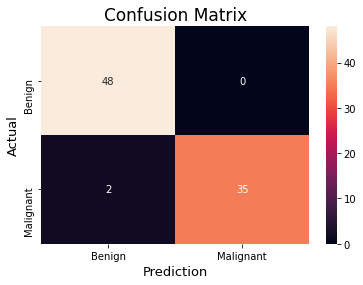


              precision    recall  f1-score   support

           0       0.96      1.00      0.98        48
           1       1.00      0.95      0.97        37

    accuracy                           0.98        85
   macro avg       0.98      0.97      0.98        85
weighted avg       0.98      0.98      0.98        85


Accuracy Score :  97.65 %



In [25]:
print('============= Predict With CV Data =============')
print('\n================================================')
y_predict_SVM_CV = svm_model.predict(x_cv_scaled)
print('\n================================================')
cm_design(y_cv,y_predict_SVM_CV)
print('\n================================================')
print(classification_report(y_cv,y_predict_SVM_CV))
print('\n================================================')
accuracy_score_svm = accuracy_score(y_cv,y_predict_SVM_CV)
print(f'Accuracy Score : {accuracy_score_svm * 100 : .2f} %\n')

============= Predict With Test Data =============



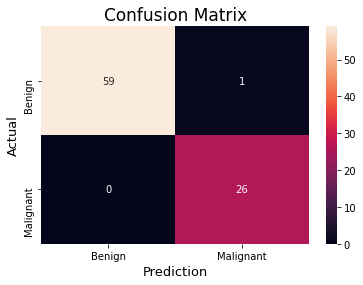


              precision    recall  f1-score   support

           0       1.00      0.98      0.99        60
           1       0.96      1.00      0.98        26

    accuracy                           0.99        86
   macro avg       0.98      0.99      0.99        86
weighted avg       0.99      0.99      0.99        86


Accuracy Score :  98.84 %



In [26]:
print('============= Predict With Test Data =============')
print('\n================================================')
y_predict_SVM_test = svm_model.predict(x_test_scaled)
cm_design(y_test,y_predict_SVM_test)
print('\n================================================')
print(classification_report(y_test,y_predict_SVM_test))
print('\n================================================')
accuracy_score_svm = accuracy_score(y_test,y_predict_SVM_test)
print(f'Accuracy Score : {accuracy_score_svm * 100 : .2f} %\n')

# *==============================================*

## Save Model

In [72]:
filename = 'Breast Cancer Detection.sav'
pickle.dump(svm_model , open(filename,'wb'))

In [86]:
# features_B = [[12.18, 20.52, 77.22, 458.7, 0.08013, 0.04038, 0.02383,0.0177,0.1739,0.05677, 
#             0.1924,1.571,1.183, 14.68, 0.00508, 0.006098, 0.01069, 0.006797, 0.01447, 0.001532, 
#             13.34,32.84, 84.58, 547.8, 0.1123, 0.08862, 0.1145, 0.07431, 0.2694, 0.06878]]
# =============================================================================================
# features_M

features = [[19.4,18.18,127.2,1145,0.1037,0.1442,0.1626,0.09464,0.1893,0.05892,
            0.4709,0.9951,2.903,53.16,0.005654,0.02199,0.03059,0.01499,0.01623,0.001965,
            23.79,28.65,152.4,1628,0.1518,0.3749,0.4316,0.2252,0.359,0.07787]]

# ==> Load RobustScaler For Scaling New Data
scaler_newData = joblib.load('./scaler.joblib')
x_newData_scaled = scaler_newData.transform(np.array(features))
# ==> 
x_newData_scaled

array([[ 1.86193759, -0.32082049,  1.78548514,  1.87996762,  0.48168773,
         0.86303277,  1.06240607,  1.27618277,  0.19418357, -0.59603064,
         0.44123399, -0.48261915,  0.18588739,  0.57818856, -0.4791448 ,
        -0.06187937,  0.0466963 ,  0.70523911, -0.56016854, -0.62722744,
         1.83939577,  0.37651419,  1.60472844,  1.59680562,  0.81755601,
         1.03596554,  0.8709191 ,  1.86016442,  1.05974978, -0.2931948 ]])

In [87]:
# load the model
load_model = pickle.load(open("./Breast Cancer Detection.sav", 'rb'))
y_newData_ = load_model.predict(x_newData_scaled)
if y_newData_ == '0':
    print(' {B} Benign')
else:
    print(' {M} Malignant')

 {M} Malignant
